***AKBANK DERİN ÖĞRENME KAMPI BOOTCAMP PROJESİ**


                                           ŞİFANUR ÖZDEMİR-BERAT KESKİN

Bu proje, Akbank Derin Öğrenme Bootcamp kapsamında geliştirilmiş olup, farklı balık türlerinin sınıflandırılmasını hedeflemektedir. a-large-scale-fish-dataset adlı veri setini kullanarak Convolutional Neural Network (CNN) mimarisine dayalı bir derin öğrenme modeli oluşturulmuştur. Veri setinde 10 farklı balık türünden 9.000 görüntü bulunmaktadır. Bu model, TensorFlow ve Keras kütüphaneleri kullanılarak geliştirilmiş, başarı oranı ise %97.39 elde edilmiştir.

In [143]:

#klasik kütüphaneler
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split

#tensorflow 
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.utils import plot_model
from sklearn.metrics import accuracy_score





os: Dosya ve dizin işlemleri yapmak için kullanılır.

numpy: Sayısal verilerle çalışmak ve çok boyutlu dizileri işlemek için kullanılır.

pandas: Veri analizi ve veri manipülasyonu için kullanılır.

matplotlib.pyplot: Grafik ve görselleştirme işlemleri için kullanılır.

seaborn: İstatistiksel veri görselleştirmeleri için kullanılan bir kütüphane.

sklearn.model_selection.train_test_split: Veriyi eğitim ve test seti olarak bölmek için kullanılır.

tensorflow: Derin öğrenme modellerini oluşturmak için ana kütüphanedir.

ImageDataGenerator: Görüntü verilerini artırmak ve ön işlemek için kullanılır.

ResNet50.preprocess_input: ResNet50 modeli için önceden eğitilmiş ağırlıklarla uyumlu hale getirmek amacıyla görüntü verilerini işler.

Sequential: Modelin katmanlarını ardışık şekilde tanımlamak için kullanılır.

Dense, Flatten, Dropout, BatchNormalization: Sinir ağı katmanlarıdır, öğrenmeyi düzenler ve iyileştirir.

Adam: Optimizasyon algoritmasıdır.

EarlyStopping, ReduceLROnPlateau: Model eğitiminde aşırı öğrenmeyi (overfitting) önlemek ve eğitim sürecini iyileştirmek için kullanılan callback'lerdir.

plot_model: Modelin yapısını grafiksel olarak görselleştirmek için kullanılır.

In [115]:
directory = '/kaggle/input/a-large-scale-fish-dataset/Fish_Dataset/Fish_Dataset'

classes = [i for i in os.listdir(directory) if '.'not in i]
classes


['Hourse Mackerel',
 'Black Sea Sprat',
 'Sea Bass',
 'Red Mullet',
 'Trout',
 'Striped Red Mullet',
 'Shrimp',
 'Gilt-Head Bream',
 'Red Sea Bream']

Bu kod, belirtilen dizindeki (directory) klasörlerin isimlerini döndürür. Her bir klasör, bir balık türünü temsil eder. os.listdir() komutu ile dizindeki dosyalar ve klasörler listelenir, ve klasörler arasından dosya uzantısına sahip olmayanlar seçilir (balık türü klasörleri).

In [116]:
label = []
path = []

for dir_name, _, filenames in os.walk(directory):
    for filename in filenames:
        if dir_name.split()[-1]!='GT':
            if os.path.splitext(filename)[-1]=='.png':
                label.append(os.path.split(dir_name)[-1])
                path.append(os.path.join(dir_name, filename))
                
data = pd.DataFrame(columns=['path','label'])
data['path']=path
data['label']=label
data

,path,label
0,/kaggle/input/a-large-scale-fish-dataset/Fish_...,Hourse Mackerel
1,/kaggle/input/a-large-scale-fish-dataset/Fish_...,Hourse Mackerel
2,/kaggle/input/a-large-scale-fish-dataset/Fish_...,Hourse Mackerel
3,/kaggle/input/a-large-scale-fish-dataset/Fish_...,Hourse Mackerel
4,/kaggle/input/a-large-scale-fish-dataset/Fish_...,Hourse Mackerel
...,...,...
8995,/kaggle/input/a-large-scale-fish-dataset/Fish_...,Red Sea Bream
8996,/kaggle/input/a-large-scale-fish-dataset/Fish_...,Red Sea Bream
8997,/kaggle/input/a-large-scale-fish-dataset/Fish_...,Red Sea Bream
8998,/kaggle/input/a-large-scale-fish-dataset/Fish_...,Red Sea Bream


Bu kod, veri setindeki tüm balık görüntü dosyalarını ve etiketlerini tarar ve bunları bir Pandas DataFrame'e aktarır.

os.walk() dizindeki tüm klasörleri ve dosyaları tarar.
.png uzantısına sahip dosyalar (balık görüntüleri) filtrelenir.
Her bir görüntünün yolu path, görüntünün bulunduğu klasör ise label olarak kaydedilir.
Son olarak bu bilgiler bir DataFrame'e aktarılır.

In [117]:
# DataFrame içindeki toplam görüntü sayısını yazdırır
print("Görüntü sayısı:", len(data))

# 'label' sütunundaki her bir türün kaç kez tekrar ettiğini sayar ve yazdırır
print("Tür başına görüntü sayısı:", data.label.value_counts())


Görüntü sayısı: 9000
Tür başına görüntü sayısı: label
Hourse Mackerel       1000
Black Sea Sprat       1000
Sea Bass              1000
Red Mullet            1000
Trout                 1000
Striped Red Mullet    1000
Shrimp                1000
Gilt-Head Bream       1000
Red Sea Bream         1000
Name: count, dtype: int64


İlk satır, veri setindeki toplam balık görüntüsünün sayısını ekrana yazdırır.

İkinci satır ise, her bir balık türünün kaç kez tekrar ettiğini (görüntü sayısı) gösterir. data.label.value_counts() komutu ile her türün kaç görüntüsü olduğunu sayar.

Bu kod, veri setinin dengeli olup olmadığını anlamak için kullanışlıdır.

In [118]:
# DataFrame'in boyutunu (satır ve sütun sayısını) yazdırır
print("-DataFrame boyutu:", data.shape)

# 'label' sütunundaki benzersiz değerlerin sayısını yazdırır (balık türü sayısı)
print("\n-Balık türü sayısı:", data['label'].nunique())

# DataFrame hakkında genel bilgileri yazdırır (sütun isimleri, veri tipleri, boş değer sayıları vb.)
print("\n-DataFrame bilgileri:\n")
data.info()

# DataFrame'in ilk 5 satırını yazdırır (örnek veri görmek için)
print("\n-İlk 5 örnek:")
print(data.head())

# DataFrame'in son 5 satırını yazdırır (veri setinin son kısmını görmek için)
print("\n-Son 5 örnek:")
print(data.tail())


-DataFrame boyutu: (9000, 2)

-Balık türü sayısı: 9

-DataFrame bilgileri:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9000 entries, 0 to 8999
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   path    9000 non-null   object
 1   label   9000 non-null   object
dtypes: object(2)
memory usage: 140.8+ KB

-İlk 5 örnek:
                                                path            label
0  /kaggle/input/a-large-scale-fish-dataset/Fish_...  Hourse Mackerel
1  /kaggle/input/a-large-scale-fish-dataset/Fish_...  Hourse Mackerel
2  /kaggle/input/a-large-scale-fish-dataset/Fish_...  Hourse Mackerel
3  /kaggle/input/a-large-scale-fish-dataset/Fish_...  Hourse Mackerel
4  /kaggle/input/a-large-scale-fish-dataset/Fish_...  Hourse Mackerel

-Son 5 örnek:
                                                   path          label
8995  /kaggle/input/a-large-scale-fish-dataset/Fish_...  Red Sea Bream
8996  /kaggle/input/a-large-scale-fish-d

data.shape: DataFrame'deki toplam satır ve sütun sayısını yazdırır. Bu, veri setinin genel büyüklüğünü anlamamıza yardımcı olur.

data['label'].nunique(): label sütunundaki benzersiz balık türlerinin sayısını döndürür.

data.info(): DataFrame hakkında bilgi verir; sütun isimleri, veri tipleri, boş değer olup olmadığı gibi temel bilgileri gösterir.

data.head(): Veri setinin ilk 5 satırını görüntülemek için kullanılır.

data.tail(): Veri setinin son 5 satırını görüntülemek için kullanılır. Veri setinin hem başı hem de sonu görülerek örnek veriler hakkında bilgi alınabilir.

In [119]:
print(data) #[H|T] olarak yazdırır.

                                                   path            label
0     /kaggle/input/a-large-scale-fish-dataset/Fish_...  Hourse Mackerel
1     /kaggle/input/a-large-scale-fish-dataset/Fish_...  Hourse Mackerel
2     /kaggle/input/a-large-scale-fish-dataset/Fish_...  Hourse Mackerel
3     /kaggle/input/a-large-scale-fish-dataset/Fish_...  Hourse Mackerel
4     /kaggle/input/a-large-scale-fish-dataset/Fish_...  Hourse Mackerel
...                                                 ...              ...
8995  /kaggle/input/a-large-scale-fish-dataset/Fish_...    Red Sea Bream
8996  /kaggle/input/a-large-scale-fish-dataset/Fish_...    Red Sea Bream
8997  /kaggle/input/a-large-scale-fish-dataset/Fish_...    Red Sea Bream
8998  /kaggle/input/a-large-scale-fish-dataset/Fish_...    Red Sea Bream
8999  /kaggle/input/a-large-scale-fish-dataset/Fish_...    Red Sea Bream

[9000 rows x 2 columns]


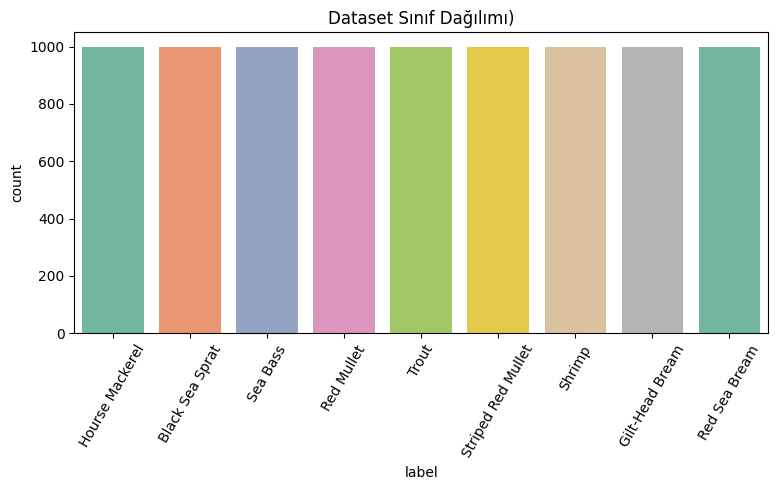

In [120]:

plt.figure(figsize=(15, 5))

plt.subplot(1, 2, 1)

sns.countplot(data=data, x='label', palette='Set2')  
plt.xticks(rotation=60) 
plt.title('Dataset Sınıf Dağılımı)') 

plt.tight_layout() 
plt.show()

Bu kod, veri setindeki balık türlerinin dağılımını görselleştirir.
sns.countplot: label sütunundaki balık türlerinin sayısını (görüntü sayısı) çubuk grafik ile gösterir.

plt.xticks(rotation=60): Balık türlerinin isimlerini daha net görebilmek için 60 derece döndürür.

plt.title: Grafiğe başlık ekler.

plt.tight_layout(): Alt grafiklerin birbirine girmesini önlemek ve düzenli bir görünüm sağlamak için kullanılır.


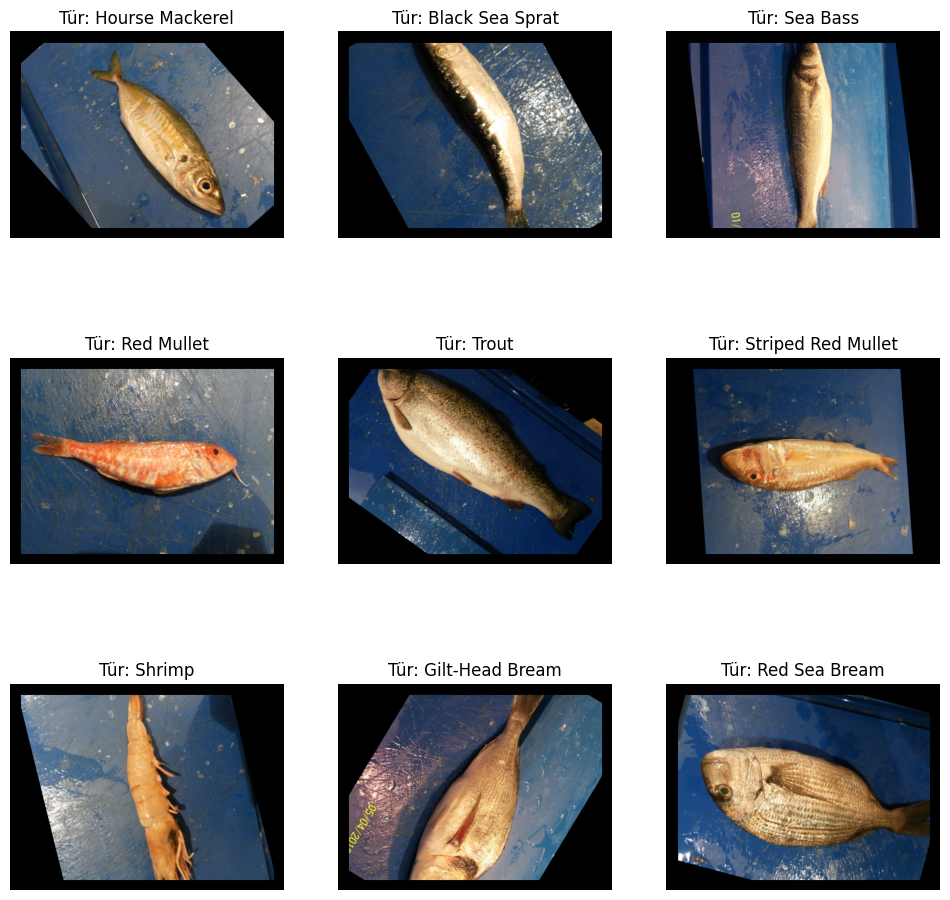

In [121]:
i = 0 
plt.figure(figsize=(12,12))

for unique_label in data['label'].unique():
    plt.subplot(3, 3, i + 1)
    img_path = data[data['label'] == unique_label].iloc[0, 0]
    img = plt.imread(img_path) 
    plt.imshow(img)
    plt.title(f"Tür: {unique_label}")
    ax = plt.gca()
    ax.add_patch(plt.Rectangle((0, 0), img.shape[1], img.shape[0], 
                               edgecolor='black', fill=False, lw=15))
    plt.axis('off')
    i+= 1
plt.show()

Bu kod, her bir balık türünden bir örnek görüntüleyerek türleri görsel olarak tanıtır.

plt.subplot(3, 3, i + 1): 3x3’lük bir matris yapısında her bir tür için bir görüntü alanı ayırır.

data['label'] == unique_label: Her tür için sadece bir örnek görüntü alınır.

plt.imshow(img): Görüntü dosyasını ekrana basar.

plt.title: Görüntünün üzerinde balık türünün adını gösterir.

plt.axis('off'): Eksenleri gizler.

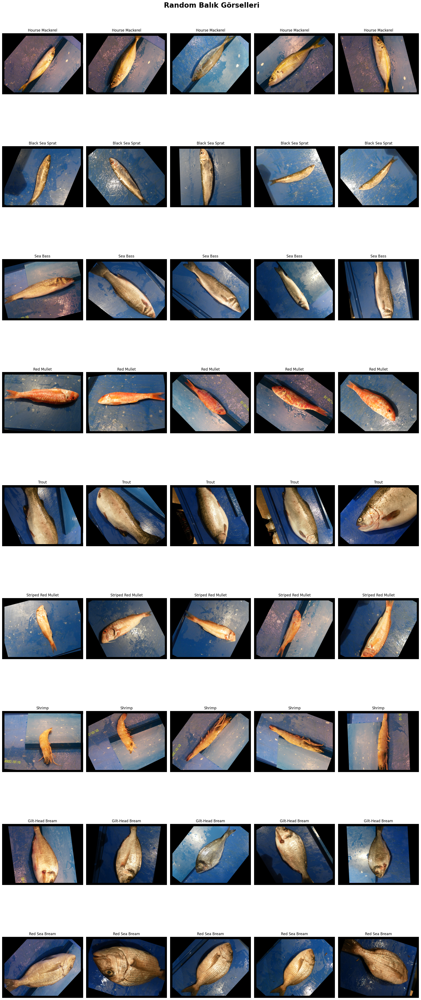

In [122]:
# Balık türlerini ve görüntü sayılarını belirtiyoruz
fish_types = ['Hourse Mackerel', 'Black Sea Sprat', 'Sea Bass', 'Red Mullet', 'Trout', 
              'Striped Red Mullet', 'Shrimp', 'Gilt-Head Bream', 'Red Sea Bream']

# Her bir balık türü için 5 rastgele görsel seç ve alt alta yerleştir
plt.figure(figsize=(20, 50))  
plt.suptitle(" Random Balık Görselleri", fontsize=24, fontweight='bold')

i = 0

for fish in fish_types:
    fish_images = data[data['label'] == fish].sample(5).path
    
    for fish_image in fish_images:
        plt.subplot(len(fish_types), 5, i + 1)
        img = plt.imread(fish_image)
        plt.imshow(img)
        plt.title(fish) 
        plt.axis("off")
        
        ax = plt.gca()
        ax.add_patch(plt.Rectangle((0, 0), img.shape[1], img.shape[0], edgecolor='black', fill=False, lw=15))
        
        i += 1

plt.tight_layout()
plt.show()


Bu kod, her balık türünden 5 rastgele görsel seçer ve görselleri alt alta sıralayarak görselleştirir. Her türün görüntüleri, birden fazla türün çeşitliliğini daha iyi anlayabilmek için yan yana gösterilir. Görseller ekranda eksensiz bir şekilde yer alır ve başlık olarak balık türünün adı gösterilir.

In [127]:
#dataları train ve test olarak ayırma
train_data, test_data = train_test_split(data, test_size=0.2, shuffle=True, random_state=42)

print(train_data.shape)
print(test_data.shape)

(7200, 2)
(1800, 2)


Veri setini eğitim ve test olarak böler. Verinin %80’i eğitim, %20’si test için kullanılır. train_test_split fonksiyonu verileri rastgele karıştırır ve sabit bir rastgelelik sağlamak için random_state=42 parametresi kullanılır. Bu, aynı bölünmenin tekrar elde edilmesini sağlar.

In [126]:
train_generator = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    validation_split=0.2
)

test_generator = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

# Veri akışlarını oluşturalım
train_images = train_generator.flow_from_dataframe(
    dataframe=train_data,
    x_col='path',
    y_col='label',
    target_size=(128, 128),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=True,
    seed=42,
    subset='training'
)

val_images = train_generator.flow_from_dataframe(
    dataframe=train_data,
    x_col='path',
    y_col='label',
    target_size=(128, 128),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=True,
    seed=42,
    subset='validation'
)

test_images = test_generator.flow_from_dataframe(
    dataframe=test_data,
    x_col='path',
    y_col='label',
    target_size=(128,128),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=False
)

Found 5760 validated image filenames belonging to 9 classes.
Found 1440 validated image filenames belonging to 9 classes.
Found 1800 validated image filenames belonging to 9 classes.


ImageDataGenerator ile eğitim, doğrulama ve test veri setleri için veri akışları hazırlanır. Eğitim seti için veri artırma (data augmentation) işlemleri uygulanır. Görseller 128x128 boyutuna dönüştürülüp yeniden boyutlandırılır ve RGB formatında işlenir. Ayrıca eğitim verileri %20 doğrulama verisi olarak ayrılır.

In [130]:
display(train_images.class_indices)
display(val_images.class_indices)
display(test_images.class_indices)

{'Black Sea Sprat': 0,
 'Gilt-Head Bream': 1,
 'Hourse Mackerel': 2,
 'Red Mullet': 3,
 'Red Sea Bream': 4,
 'Sea Bass': 5,
 'Shrimp': 6,
 'Striped Red Mullet': 7,
 'Trout': 8}

{'Black Sea Sprat': 0,
 'Gilt-Head Bream': 1,
 'Hourse Mackerel': 2,
 'Red Mullet': 3,
 'Red Sea Bream': 4,
 'Sea Bass': 5,
 'Shrimp': 6,
 'Striped Red Mullet': 7,
 'Trout': 8}

{'Black Sea Sprat': 0,
 'Gilt-Head Bream': 1,
 'Hourse Mackerel': 2,
 'Red Mullet': 3,
 'Red Sea Bream': 4,
 'Sea Bass': 5,
 'Shrimp': 6,
 'Striped Red Mullet': 7,
 'Trout': 8}

class_indices ile her bir balık türüne atanan sınıf etiketlerini (indekslerini) görüntüleriz. Bu indeksler, modelin hangi sınıfı hangi balık türüne atadığını gösterir.

**5.ANN OLUŞTURMA**

In [133]:
# Basit bir yapay sinir ağı modeli tanımlama (Düzensiz tam bağlantılı katmanlar)

model = Sequential([
    
    # Giriş katmanı
    Flatten(input_shape=(128, 128, 3)),
    
    # 1.Katman
    Dense(512, activation='relu'),
    BatchNormalization(),
    Dropout(0.2),
    
    # 2.Katman
    Dense(256, activation='relu'),
    BatchNormalization(),
    Dropout(0.2),
    
    # 3.Katman
    Dense(128, activation='relu'),
    BatchNormalization(),
    Dropout(0.2),
    
    # Çıkış Katmanı
    Dense(len(train_images.class_indices), activation='softmax')
    
])

# Modeli derle
model.compile(optimizer='Adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Model özetini yazdır
model.summary()

Model: "sequential"


/opt/conda/lib/python3.10/site-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten (Flatten)               │ (None, 49152)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │    25,166,336 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 9)              │         1,161 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 25,335,305 (96.65 MB)

 Trainable params: 25,333,513 (96.64 MB)

 Non-trainable params: 1,792 (7.00 KB)

Bu kısımda basit bir yapay sinir ağı modeli tanımlanır. İlk katman giriş verisini alır ve Flatten işlemi ile 128x128 boyutlu görüntüleri düzleştirir. Her katman, relu aktivasyon fonksiyonu ve dropout işlemi ile düzenlenir. Çıkış katmanı, softmax fonksiyonu kullanarak sınıflandırma yapar. Model, Adam optimizasyon algoritması ve categorical_crossentropy kayıp fonksiyonu ile derlenir.

In [139]:
#modeli eğitme
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)
def lr_scheduler(epoch, lr):
    if epoch >= 10:
        return lr * 0.95 
    return lr
lr_scheduler_callback = tf.keras.callbacks.LearningRateScheduler(lr_scheduler)

model.compile(
    optimizer=tf.keras.optimizers.Adagrad(learning_rate=0.01), 
    loss='categorical_crossentropy',
    metrics=['accuracy'] )

with tf.device('/GPU:0'):
    result = model.fit(
        train_images ,
        epochs=30,
        batch_size=32,
        validation_data=val_images,
        callbacks=[early_stopping,lr_scheduler_callback])


Epoch 1/30
180/180 ━━━━━━━━━━━━━━━━━━━━ 111s 590ms/step - accuracy: 0.8011 - loss: 0.5986 - val_accuracy: 0.8569 - val_loss: 0.4257 - learning_rate: 0.0100
Epoch 2/30
180/180 ━━━━━━━━━━━━━━━━━━━━ 108s 584ms/step - accuracy: 0.8530 - loss: 0.4417 - val_accuracy: 0.9049 - val_loss: 0.3079 - learning_rate: 0.0100
Epoch 3/30
180/180 ━━━━━━━━━━━━━━━━━━━━ 108s 583ms/step - accuracy: 0.8847 - loss: 0.3481 - val_accuracy: 0.8819 - val_loss: 0.3430 - learning_rate: 0.0100
Epoch 4/30
180/180 ━━━━━━━━━━━━━━━━━━━━ 107s 582ms/step - accuracy: 0.9112 - loss: 0.2685 - val_accuracy: 0.9042 - val_loss: 0.2729 - learning_rate: 0.0100
Epoch 5/30
180/180 ━━━━━━━━━━━━━━━━━━━━ 107s 581ms/step - accuracy: 0.9310 - loss: 0.2089 - val_accuracy: 0.9056 - val_loss: 0.2964 - learning_rate: 0.0100
Epoch 6/30
180/180 ━━━━━━━━━━━━━━━━━━━━ 108s 582ms/step - accuracy: 0.9420 - loss: 0.1790 - val_accuracy: 0.9354 - val_loss: 0.2414 - learning_rate: 0.0100
Epoch 7/30
180/180 ━━━━━━━━━━━━━━━━━━━━ 108s 583ms/step - accura

Model, 30 epoch boyunca eğitilir ve erken durdurma (early stopping) ve öğrenme oranı azaltma (learning rate scheduler) gibi iyileştirme teknikleri kullanılır. Modelin eğitim süreci sırasında doğrulama verisine göre val_loss (doğrulama kaybı) takip edilir. Eğer model performansı belirli bir süre boyunca iyileşmezse, eğitim durdurulur ve en iyi ağırlıklar geri yüklenir.



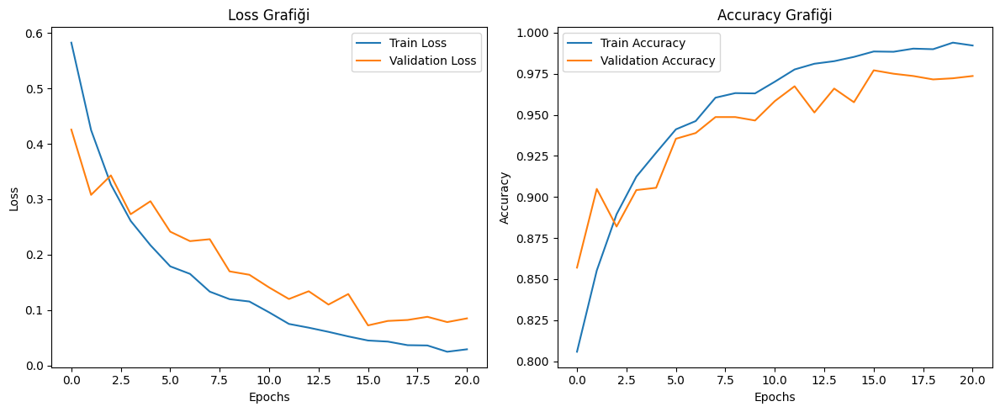

In [140]:
#Grafik

plt.figure(figsize=(12, 5))

# Loss grafiği
plt.subplot(1, 2, 1)
plt.plot(result.history['loss'], label='Train Loss')
plt.plot(result.history['val_loss'], label='Validation Loss')
plt.title('Loss Grafiği')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Accuracy grafiği
plt.subplot(1, 2, 2)
plt.plot(result.history['accuracy'], label='Train Accuracy')
plt.plot(result.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy Grafiği')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

Eğitim sürecinde elde edilen loss (kayıp) ve accuracy (doğruluk) değerleri grafik üzerinde gösterilir. Bu grafikler, modelin eğitim ve doğrulama setindeki performansını zamanla (epochlar boyunca) nasıl iyileştirdiğini görselleştirir. Eğitim ve doğrulama eğrileri arasındaki farklar, modelin aşırı öğrenme (overfitting) yapıp yapmadığını anlamaya yardımcı olur.

In [141]:
# Model değerlendirme

test_loss, test_accuracy = model.evaluate(test_images)
print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")

57/57 ━━━━━━━━━━━━━━━━━━━━ 33s 588ms/step - accuracy: 0.9649 - loss: 0.1312
Test Loss: 0.0977
Test Accuracy: 0.9739


In [146]:
# Doğruluk Skoru
predictions = model.predict(test_images)
predicted_labels = np.argmax(predictions, axis=1)

predict_data = pd.DataFrame({
    'label': test_images.classes,  # Gerçek etiketler
    'pred': predicted_labels       # Model tahminleri
})


print(f"Doğruluk Scoru: {accuracy_score(predict_data['label'], predict_data['pred'])}")

57/57 ━━━━━━━━━━━━━━━━━━━━ 21s 376ms/step
Doğruluk Scoru: 0.9738888888888889


Doğruluk Skoru Hesaplama
Bu adımda model, test veri seti üzerindeki doğruluğunu hesaplar. Modelin test veri setindeki tahminleri, gerçek etiketler ile karşılaştırılarak accuracy_score metriği kullanılır. Bu metrik, modelin test verisi üzerinde ne kadar başarılı olduğunu gösterir. Doğruluk skoru % üzerinden hesaplanır.

Bu deneyde doğruluk skorumuz %97.38 olarak hesaplanmıştır.